In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import networkx as nx
from pathlib import Path

from neural_reconstruction.core.topology import TopologyBuilder
from neural_reconstruction.core.pathfinding import PathFinder
from neural_reconstruction.algorithms.fragment_linking.utils import compute_vector_angle,is_direction_too_similar
from neural_reconstruction.core.preprocessing import dilate_epidermis_vertically

import skimage as ski
# from skimage.measure import label
from scipy.spatial import KDTree


In [2]:
BASE_PATH = Path('/home/pony/projects/ienf_q/data_0331')
IMAGE_ID = 'S222-2_a'



In [3]:
image      = cv2.imread(f'{BASE_PATH}/{IMAGE_ID}/image.png',       cv2.IMREAD_COLOR_RGB)[:, :, 1]  # 只取綠色通道
mask       = cv2.imread(f'{BASE_PATH}/{IMAGE_ID}/mask.png',        cv2.IMREAD_GRAYSCALE)
annotation = cv2.imread(f'{BASE_PATH}/{IMAGE_ID}/weka.png',        cv2.IMREAD_GRAYSCALE)
label      = cv2.imread(f'{BASE_PATH}/{IMAGE_ID}/label.png',       cv2.IMREAD_GRAYSCALE)


In [4]:

roi_mask = dilate_epidermis_vertically(mask, offset_px=50)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (51, 51))
background = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
image = cv2.subtract(image, background)

roi_image = cv2.bitwise_and(image, image, mask=roi_mask)
roi_annotation = cv2.bitwise_and(annotation, annotation, mask=roi_mask)

# apply opening to roi_annotation to remove small noise
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
# roi_annotation = cv2.morphologyEx(roi_annotation, cv2.MORPH_OPEN, kernel)

# apply closing to roi_annotation to fill small holes
roi_annotation = cv2.morphologyEx(roi_annotation, cv2.MORPH_CLOSE, kernel, iterations=3)
roi_annotation[roi_annotation > 0] = 255


gt_builder = TopologyBuilder()
roi_label = cv2.bitwise_and(label, label, mask=roi_mask)
roi_label = cv2.morphologyEx(roi_label, cv2.MORPH_CLOSE, kernel, iterations=3)
gt_graph = gt_builder.build_seed_graph(roi_label)


/home/pony/projects/ienf_q/src/neural_reconstruction/core/topology/topology_builder.py:125: VisibleDeprecationWarning: separator in column name will change to _ in version 0.13; to silence this warning, use `separator='-'` to maintain current behavior and use `separator='_'` to switch to the new default behavior.
  summary = summarize(skel_obj)


In [5]:

annotation_component = np.asarray(ski.measure.label(roi_annotation, connectivity=2))

# 2. 骨架化 + 種子切分
topology_builder = TopologyBuilder(segment_length=3.0)
global_graph = topology_builder.build_seed_graph(roi_annotation, roi_image)

# 從 labeled image 補上 component_id
for node in global_graph.nodes():
    y, x = node
    global_graph.nodes[node]["component_id"] = int(annotation_component[int(y), int(x)])

# 元件內邊設低成本
for u, v, data in global_graph.edges(data=True):
    data["weight"] = 1e-5
# 3. 元件間路徑查找
cost_map = ((255 - roi_image.astype(np.float64)) / 255) ** 2


/home/pony/projects/ienf_q/src/neural_reconstruction/core/topology/topology_builder.py:125: VisibleDeprecationWarning: separator in column name will change to _ in version 0.13; to silence this warning, use `separator='-'` to maintain current behavior and use `separator='_'` to switch to the new default behavior.
  summary = summarize(skel_obj)


In [6]:
path_finder = PathFinder(cost_map)
topology_points = np.array(list(global_graph.nodes()))

kdtree = KDTree(topology_points)
seed_map = np.zeros_like(cost_map, dtype=bool)
for p in topology_points:
    seed_map[p[0], p[1]] = True

path_finder = PathFinder(cost_map)
topology_points = np.array(list(global_graph.nodes()))

path_lookup = path_finder.find_paths_from_seeds(
    topology_points=topology_points,
    kdtree=kdtree,
    search_radius=50,
    seed_map=seed_map,
    label_img=annotation_component,
)

In [ ]:

# ============================================================
# Featurized Path Pair
# ============================================================
import pandas as pd
from neural_reconstruction.algorithms.fragment_linking.utils import (
    compute_fiber_orientation_field,
    get_point_orientation,
)

SIGMA = 2
orient_y, orient_x = compute_fiber_orientation_field(roi_image, sigma=SIGMA)

def get_orientation(pt):
    return get_point_orientation(orient_y, orient_x, pt)

print(f"Orientation field computed (sigma={SIGMA}). Shape: {orient_y.shape}")


In [9]:

# ============================================================
# Feature extraction
# ============================================================

def extract_path_features(source, target, path, cost):
    """
    Group 1 – Cost features
        mean_cost   : cost / path_length  (average per-step cost)
        cost_std    : std of per-pixel cost_map values along path
        max_cost    : maximum per-pixel cost along path (darkest point)
        path_length : number of pixels in path

    Group 2 – Geometric features (Hessian-based local orientation)
        angle_A  : angle between fiber orientation at A and A→B direction [0,90]°
        angle_B  : angle between fiber orientation at B and B→A direction [0,90]°
        angle_AB : consistency of tangents at A and B – how "parallel" they are [0,90]°
                   0° = smooth curve, 90° = orientations are perpendicular
    """
    path_arr = np.array(path)
    path_length = len(path_arr)

    # --- Group 1: Cost features ---
    step_costs = cost_map[path_arr[:, 0], path_arr[:, 1]]
    mean_cost  = cost / path_length
    cost_std   = float(np.std(step_costs))
    max_cost   = float(np.max(step_costs))

    # --- Group 2: Geometric features ---
    o_A = get_orientation(source)   # local fiber direction at A
    o_B = get_orientation(target)   # local fiber direction at B

    # Connection direction A→B (unit vector)
    conn = np.array(target, dtype=float) - np.array(source, dtype=float)
    conn_unit = conn / (np.linalg.norm(conn) + 1e-10)

    # Tangent-connection angle: use abs(dot) because orientation is undirected
    def _angle_undirected(v, u):
        return float(np.degrees(np.arccos(np.clip(abs(np.dot(v, u)), 0.0, 1.0))))

    angle_A = _angle_undirected(o_A,  conn_unit)   # A's orientation vs A→B
    angle_B = _angle_undirected(o_B, -conn_unit)   # B's orientation vs B→A

    # Tangent consistency: align o_B to o_A's half-space, then measure angle
    o_B_aligned = o_B if np.dot(o_A, o_B) >= 0 else -o_B
    angle_AB = float(np.degrees(np.arccos(np.clip(np.dot(o_A, o_B_aligned), -1.0, 1.0))))

    return dict(
        source= source,
        target=target,
        mean_cost=mean_cost,
        cost_std=cost_std,
        max_cost=max_cost,
        path_length=path_length,
        angle_A=angle_A,
        angle_B=angle_B,
        angle_AB=angle_AB,
    )

# Build feature dataframe
records = []
seen = set()
for (source, target), (path, cost) in path_lookup.items():
    
    if (source, target) in seen or (target,source) in seen :
        continue  
    seen.add((source, target))
    feat = extract_path_features(source, target, path, cost)
    records.append(feat)

df = pd.DataFrame(records)
print(df[['mean_cost', 'cost_std', 'max_cost', 'path_length',
                            'angle_A', 'angle_B', 'angle_AB']].mean().T.to_string())


mean_cost       0.883412
cost_std        0.088402
max_cost        0.870940
path_length    27.325043
angle_A        43.427669
angle_B        45.479829
angle_AB       40.909017


In [10]:

composit_path = {}
for feat in records:
    # Normalized composite cost in [0, 1]:
    #   image evidence (mean + max cost) + geometric alignment (angle_A + angle_B)
    cost = (0.30 * feat['mean_cost']
            + 0.20 * feat['max_cost']
            + 0.25 * (feat['angle_A'] / 90.0)
            + 0.25 * (feat['angle_B'] / 90.0))

    source, target = feat['source'], feat['target']
    path, _ = path_lookup[(source, target)]
    composit_path[(source, target)] = (path, cost)

print(f"Composite paths computed: {len(composit_path)}")
costs = [c for _, c in composit_path.values()]
print(f"Cost range: [{min(costs):.4f}, {max(costs):.4f}], mean={sum(costs)/len(costs):.4f}")


Composite paths computed: 4061
Cost range: [0.0839, 1.0847], mean=0.6862


In [11]:

# ============================================================
# Build global graph with composite inter-component edges
# ============================================================

candidate_graph = global_graph.copy()

MAX_COST_THRESHOLD = 1   # reject paths that are too expensive

for (source, target), (path, cost) in composit_path.items():
    if cost > MAX_COST_THRESHOLD:
        continue
    if not candidate_graph.has_edge(source, target):
        candidate_graph.add_edge(
            source, target,
            weight=cost,
            path=path,
            phase='inter',
        )

print(f"Candidate graph: {candidate_graph.number_of_nodes()} nodes, "
      f"{candidate_graph.number_of_edges()} edges")

# Global MST
mst_graph = nx.minimum_spanning_tree(candidate_graph, weight='weight')

# Remove isolated nodes (components that couldn't be connected)
mst_graph.remove_nodes_from(list(nx.isolates(mst_graph)))

print(f"MST result    : {mst_graph.number_of_nodes()} nodes, "
      f"{mst_graph.number_of_edges()} edges, "
      f"{nx.number_connected_components(mst_graph)} components")


Candidate graph: 1402 nodes, 5124 edges
MST result    : 1401 nodes, 1363 edges, 38 components


In [12]:

# ============================================================
# Average Hausdorff Distance (AHD)
# ============================================================
from neural_reconstruction.core.evaluation import (
    extract_graph_points,
    compute_average_hausdorff_distance,
)

pred_points = extract_graph_points(mst_graph)
gt_points   = extract_graph_points(gt_graph)

ahd, d_pred_to_gt, d_gt_to_pred = compute_average_hausdorff_distance(pred_points, gt_points)

print(f"{'Average Hausdorff Distance':<28}: {ahd:.2f} px")
print(f"{'  Pred → GT':<28}: {d_pred_to_gt:.2f} px")
print(f"{'  GT → Pred':<28}: {d_gt_to_pred:.2f} px")
print(f"{'Pred points':<28}: {len(pred_points)}")
print(f"{'GT points':<28}: {len(gt_points)}")


Average Hausdorff Distance  : 2.06 px
  Pred → GT                 : 2.59 px
  GT → Pred                 : 1.52 px
Pred points                 : 7365
GT points                   : 5485


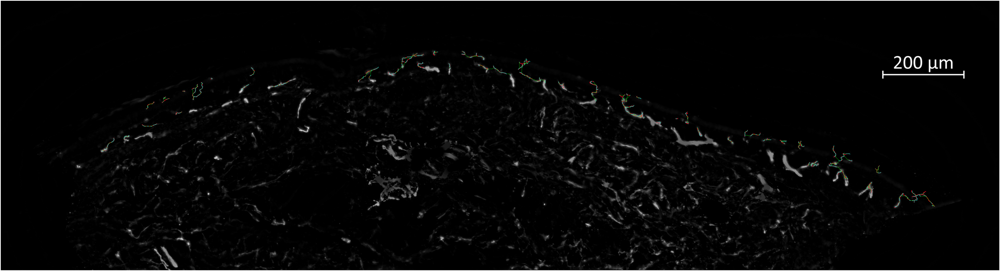

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(128, 64), constrained_layout=True)

def draw_mst_on_ax(ax, background, mst_forest, edge_color='lime', node_color='cyan',
                   linewidth=1, node_size=1.2, show_nodes=True):
    ax.imshow(background, cmap='gray' if background.ndim == 2 else None)
    for u, v, data in mst_forest.edges(data=True):
        path = data.get('path', [u, v])
        if len(path) < 2:
            continue
        ax.plot([p[1] for p in path], [p[0] for p in path],
                color=edge_color, linewidth=linewidth, alpha=0.85)
    if show_nodes:
        for node in mst_forest.nodes():
            ax.plot(node[1], node[0], '.', color=node_color, markersize=node_size)

draw_mst_on_ax(axes, image, gt_graph, edge_color='red', node_color='magenta',
               linewidth=4, node_size=1)
draw_mst_on_ax(axes, image, mst_graph,linewidth=2, node_size=5, show_nodes=True)

axes.axis('off')
plt.savefig('mst_comparison.png')
plt.show()

2.906387603535271 4.896427804681039 0.9163474023895026


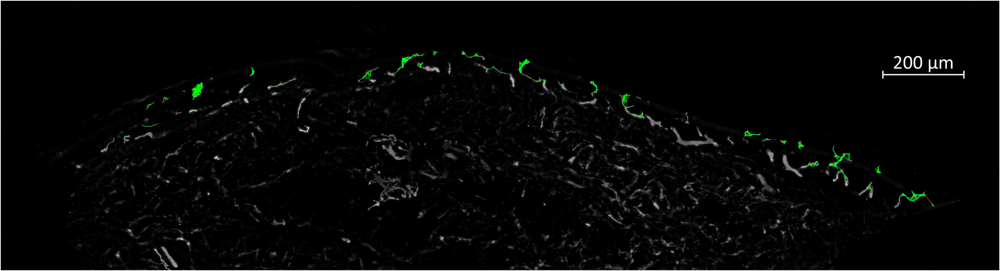

In [15]:
fig, axes = plt.subplots(1, 1, figsize=(128, 64), constrained_layout=True)

candidate_points = extract_graph_points(candidate_graph)

arrr_hd, d_candidate_to_gt, d_gt_to_condidate = compute_average_hausdorff_distance(candidate_points, gt_points)
print(arrr_hd, d_candidate_to_gt, d_gt_to_condidate)

draw_mst_on_ax(axes, image, gt_graph, edge_color='red', node_color='magenta',
               linewidth=4, node_size=1)
draw_mst_on_ax(axes, image, candidate_graph,linewidth=2, node_size=5, show_nodes=True)

axes.axis('off')
plt.savefig('candidate_graph.png')
plt.show()